# Growth model

Changes:
* Fixed convolution by creating a tested library version
* Cleared up import code, removed obsolete mask, added text cells
* Improve plotting & writeouts
* Renamed from "basic" to v1 (this is hardly a simple model)
* Move most code to library (WIP)

Model v2:
* Add country unreliability parameter, used as scale multiplier in growth rate and measurement noise.

## Import & initialization

In [2]:
%load_ext autoreload
%autoreload 2

import logging
import numpy as np
import pandas as pd
import pymc3 as pm
from datetime import datetime
import theano.tensor as T

logging.basicConfig(level=logging.INFO)
log = logging.getLogger(__name__)

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

from epimodel.pymc3_models import cm_effect

## Loading data and parameter settings

In [3]:
Regions = ['AT', 'BA', 'BE', 'BG', 'CH', 'CZ', 'DE', 'DK', 'EE', 'ES', 'FI', 'FR', 'GB', 'GR', 'HR', 'HU', 'IE', 'IS', 'IT', 'LT', 'NL', 'PL', 'RO', 'RS', 'RU', 'SE', 'SI', 'SK']
Features = ['Gatherings limited to', 'Business suspended',
       'Schools and universities closed', 'General curfew',
       'Healthcare specialisation', 'Minor distancing and hygiene measures',
       'Phone line', 'Asymptomatic contact isolation']
#'Mask wearing' - has NaNs 
data = cm_effect.Loader('2020-02-29', None, Regions, Features)

INFO:epimodel.regions:Name index has 7 potential conflicts: ['american samoa', 'georgia', 'guam', 'northern mariana islands', 'puerto rico', 'united states minor outlying islands', 'virgin islands (u.s.)']


## Create, run and plot stability of model V2

CM delay: mean 6.959979582552529, len 16, cut at 10
Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
INFO:pymc3:Initializing NUTS using adapt_diag...
CMReduction_log__            11.07
BaseGrowthRate_log__         -1.75
RegionGrowthRate_log__        7.98
RegionScaleMult_log__       -25.73
RealGrowth_log__           1782.14
InitialSize_log__           -90.20
Observed_missing              0.00
Observed                 -40893.74
Name: Log-probability of test_point, dtype: float64
Multiprocess sampling (2 chains in 2 jobs)
INFO:pymc3:Multiprocess sampling (2 chains in 2 jobs)
NUTS: [Observed_missing, InitialSize, RealGrowth, RegionScaleMult, RegionGrowthRate, BaseGrowthRate, CMReduction]
INFO:pymc3:NUTS: [Observed_missing, InitialSize, RealGrowth, RegionScaleMult, RegionGrowthRate, BaseGrowthRate, CMReduction]
Sampling 2 chains, 222 divergences: 100%|██████████| 3000/3000 [18:13<00:00,  2.74draws/s]
There were 101 divergences af

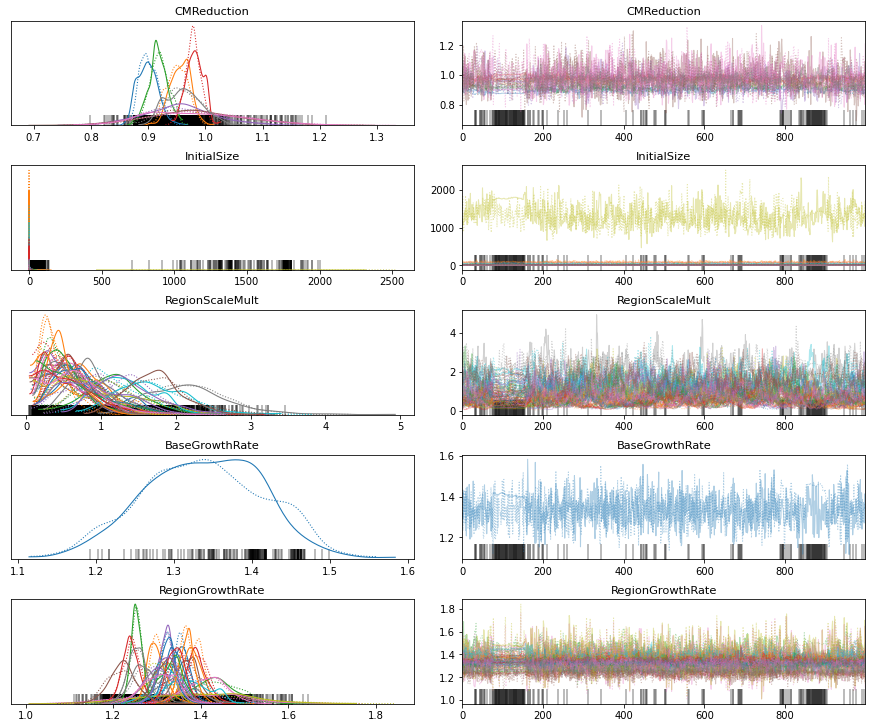

In [4]:
with cm_effect.CMModelV2(data, delay_mean=7.0) as model2:
    model2.build()
model2.run(1000)
_ = model2.plot_traces()

In [5]:
pm.backends.text.dump("../out/model_dump",model2.trace)

# Generate output

In [17]:
trace = model2.trace
quantiles = range(10,100,10)
dates = [datetime.date() for datetime in data.Ds]
index = pd.MultiIndex.from_product([Regions, dates], names=('Region', 'Date'))
df = pd.DataFrame(columns=['q'+str(q) for q in quantiles], index=index)
for i, country in enumerate(Regions):
    print(f'Processing {country}')
    for j, date in enumerate(dates):
        ys = trace['RealGrowth'][j,i,:]
        df.loc[(country, date)] = [np.quantile(ys, q/100) for q in quantiles]

datestr = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
df.to_csv(f'../out/growth_{datestr}.csv')
df.to_csv(f'../data/growth.csv')

Processing AT
Processing BA
Processing BE
Processing BG
Processing CH
Processing CZ
Processing DE
Processing DK
Processing EE
Processing ES
Processing FI
Processing FR
Processing GB
Processing GR
Processing HR
Processing HU
Processing IE
Processing IS
Processing IT
Processing LT
Processing NL
Processing PL
Processing RO
Processing RS
Processing RU
Processing SE
Processing SI
Processing SK


In [18]:
trace = model2.trace
quantiles = range(10,100,10)
dates = [datetime.date() for datetime in data.Ds]
index = pd.MultiIndex.from_product([Regions, dates], names=('Region', 'Date'))
df = pd.DataFrame(columns=["mean", "q05", "q95"], index=index)
for i, country in enumerate(Regions):
    print(f'Processing {country}')
    for j, date in enumerate(dates):
        ys = trace['RealGrowth'][j,i,:]
        df.loc[(country, date)] = [ys.mean(), np.quantile(ys, 0.05), np.quantile(ys, 0.95)]

datestr = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
df.to_csv(f'../out/growth_2_{datestr}.csv')
df.to_csv(f'../data/growth_2_.csv')

Processing AT
Processing BA
Processing BE
Processing BG
Processing CH
Processing CZ
Processing DE
Processing DK
Processing EE
Processing ES
Processing FI
Processing FR
Processing GB
Processing GR
Processing HR
Processing HU
Processing IE
Processing IS
Processing IT
Processing LT
Processing NL
Processing PL
Processing RO
Processing RS
Processing RU
Processing SE
Processing SI
Processing SK
